In [1]:
import torch
import pandas as pd
import matplotlib.pyplot as plt
from model.cycleGAN import generator
from model import utils
from pathlib import Path

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
def show_example(modelA, modelB, image_path, resize_size, padding):
    image = utils.singe_image_transform(image_path, resize_size=resize_size,
                                        padding=padding)
    with torch.no_grad():
        generated = modelA(image)
        restored = modelB(generated)
    images = torch.cat((image.cpu().detach(), generated.cpu().detach(),
                        restored.cpu().detach()))
    utils.show_images(images)

def show_samples(modelA, modelB, image_path, resize_size=256, padding=0):
    image_path = Path(image_path)
    files = list(image_path.rglob('*.jpg')) + list(image_path.rglob('*.png'))
    for file in files:
        show_example(modelA, modelB, file,
                     resize_size=resize_size, padding=padding)

## Horses 2 Zebras

Model was trained on [horses2zebra](https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/) dataset for 120 epochs with following parameters: lr = 0.0002, lambda_identity = 5, lambda_cycle = 10. Starting from 60th epoch lr was reduced by 2 times each 10 epochs.
Below losses and examples of generated images are displayed.

In [4]:
losses_horse2zebra = pd.read_csv('losses/all_losses_horse2zebra')

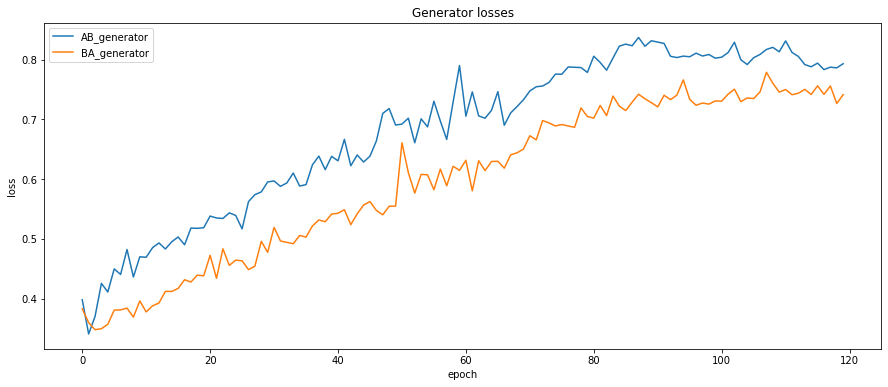

In [5]:
plt.figure(figsize=(15, 6))
plt.plot(losses_horse2zebra['AB_generator_losses'])
plt.plot(losses_horse2zebra['BA_generator_losses'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['AB_generator', 'BA_generator'])
plt.title('Generator losses');

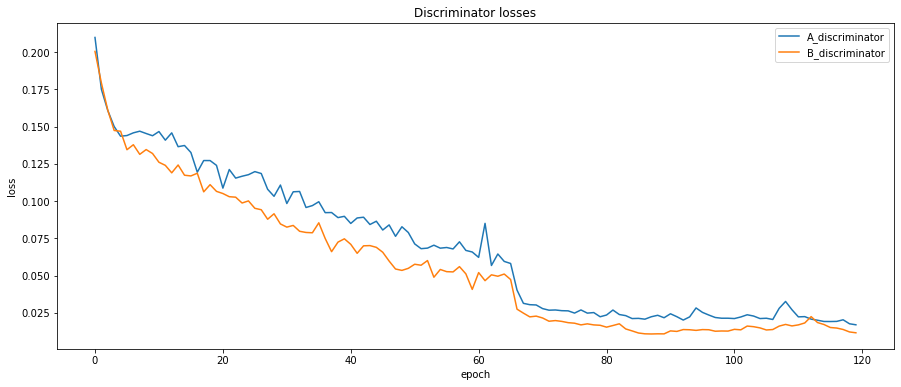

In [6]:
plt.figure(figsize=(15, 6))
plt.plot(losses_horse2zebra['A_discriminator_losses'])
plt.plot(losses_horse2zebra['B_discriminator_losses'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['A_discriminator', 'B_discriminator'])
plt.title('Discriminator losses');

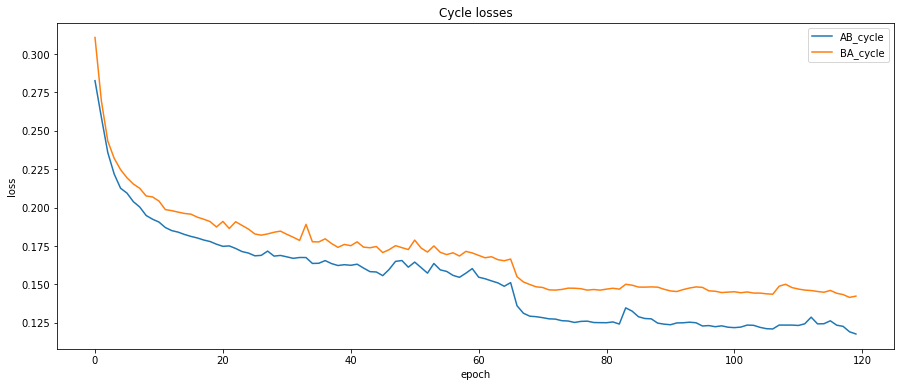

In [7]:
plt.figure(figsize=(15, 6))
plt.plot(losses_horse2zebra['AB_cycle_losses'])
plt.plot(losses_horse2zebra['BA_cycle_losses'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['AB_cycle', 'BA_cycle'])
plt.title('Cycle losses');

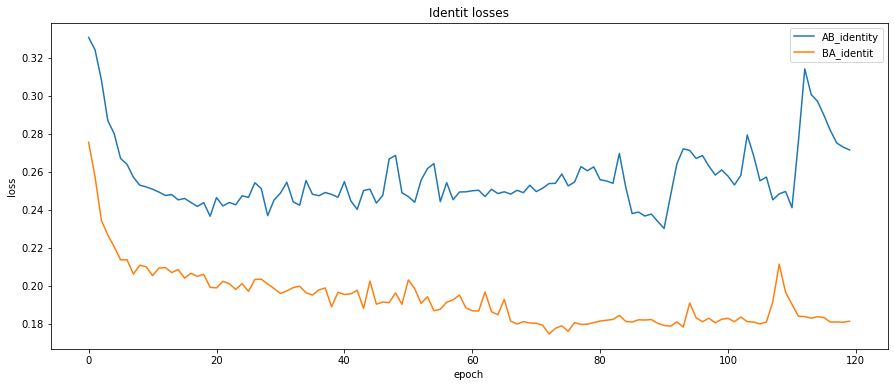

In [8]:
plt.figure(figsize=(15, 6))
plt.plot(losses_horse2zebra['AB_identity_losses'])
plt.plot(losses_horse2zebra['BA_identity_losses'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['AB_identity', 'BA_identit'])
plt.title('Identit losses');

In [9]:
model_AB_horses2zebra = generator().to(device)
model_BA_horses2zebra = generator().to(device)
model_AB_horses2zebra.load_state_dict(torch.load('weights/horse2zebra/AB_generator.pth',
                                        map_location=device))
model_BA_horses2zebra.load_state_dict(torch.load('weights/horse2zebra/BA_generator.pth',
                                        map_location=device))

<All keys matched successfully>

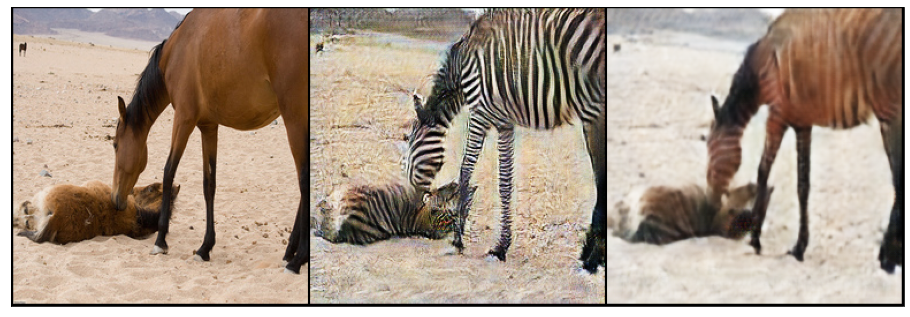

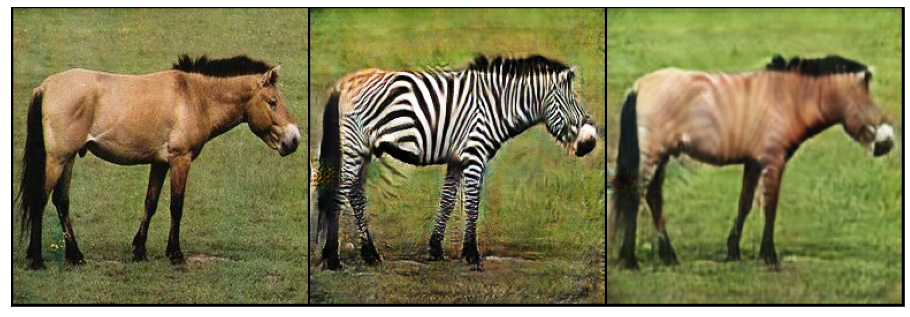

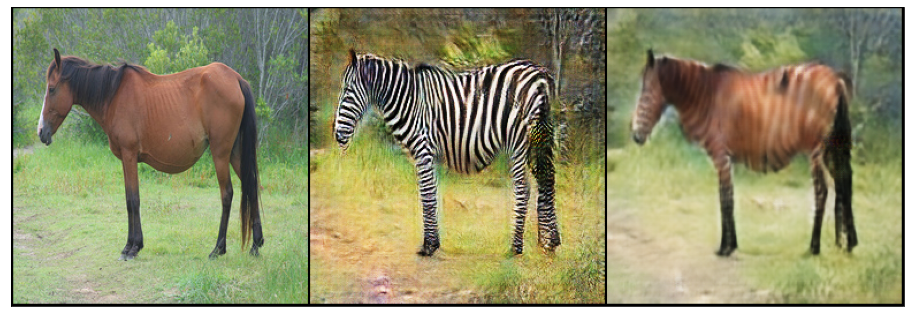

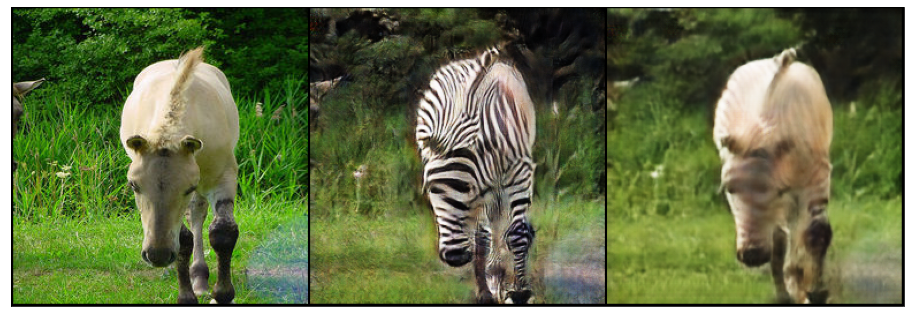

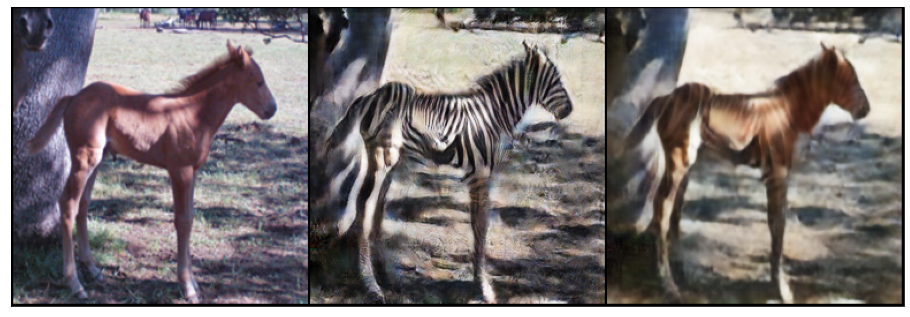

In [10]:
model_AB_horses2zebra.eval()
model_BA_horses2zebra.eval()

show_samples(model_AB_horses2zebra, model_BA_horses2zebra, 'examples/horse2zebra/horses')

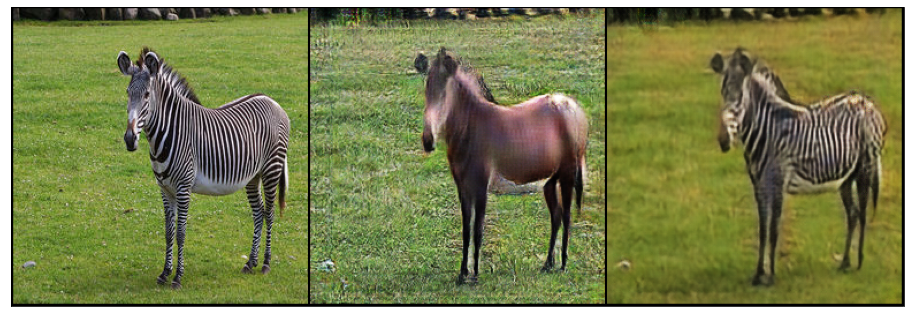

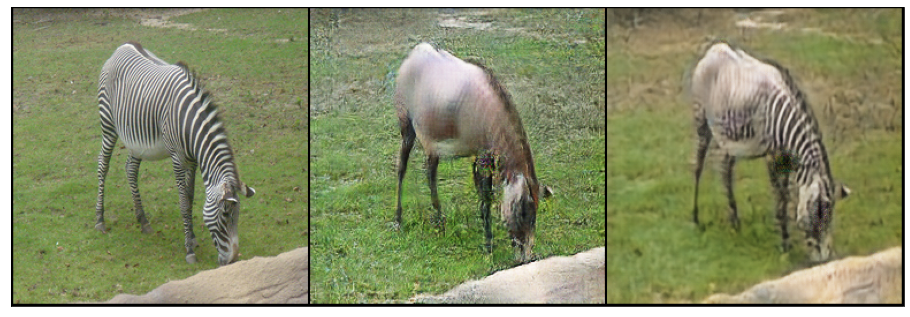

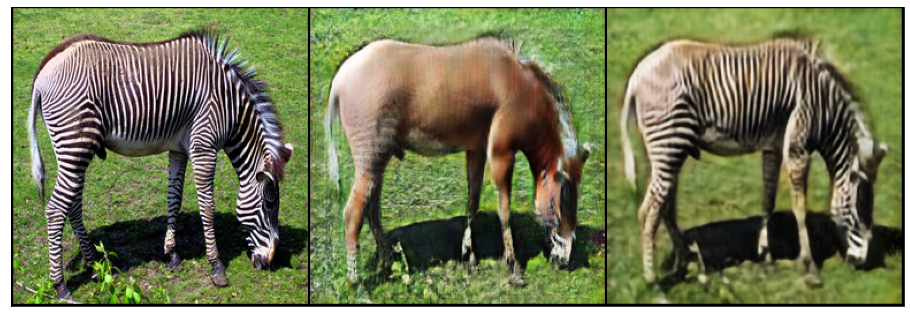

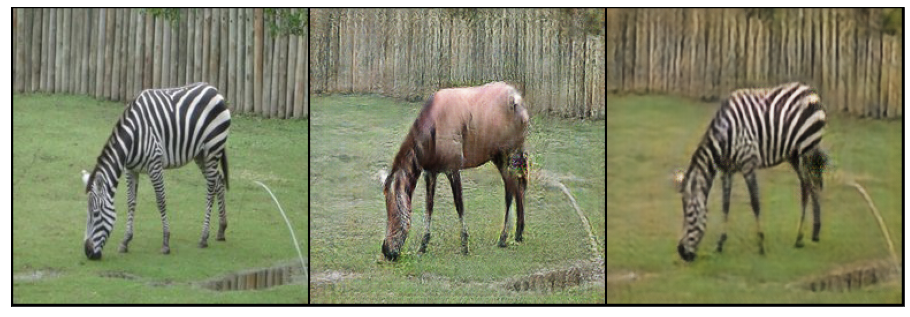

In [11]:
show_samples(model_BA_horses2zebra, model_AB_horses2zebra, 'examples/horse2zebra/zebras')

## Photo 2 Pencil Portrait

Model was trained on part of [Flickr Faces](https://github.com/NVlabs/ffhq-dataset)  dataset and dataset of pencil paitings taken from [Kaggle](https://www.kaggle.com/datasets/arbazkhan971/cuhk-face-sketch-database-cufs) for 30 epochs with following parameters: lr = 0.0001, lambda_identity = 10, lambda_cycle = 10. Below losses and examples of generated images are displayed.

In [12]:
losses_photo2portrait = pd.read_csv('losses/all_losses_photo2portrait')

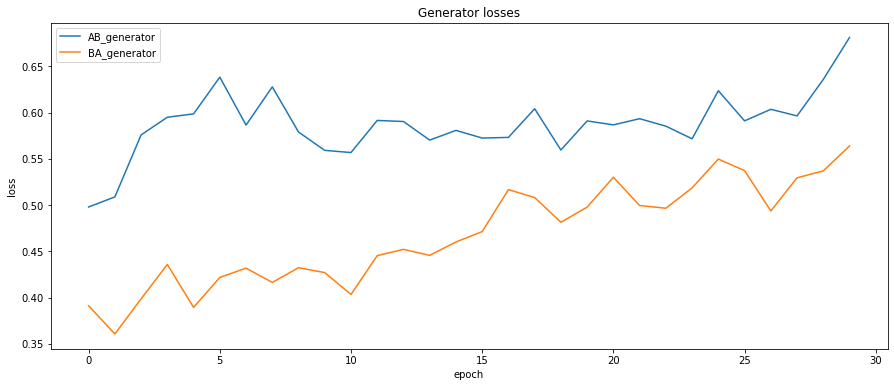

In [13]:
plt.figure(figsize=(15, 6))
plt.plot(losses_photo2portrait['AB_generator_losses'])
plt.plot(losses_photo2portrait['BA_generator_losses'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['AB_generator', 'BA_generator'])
plt.title('Generator losses');

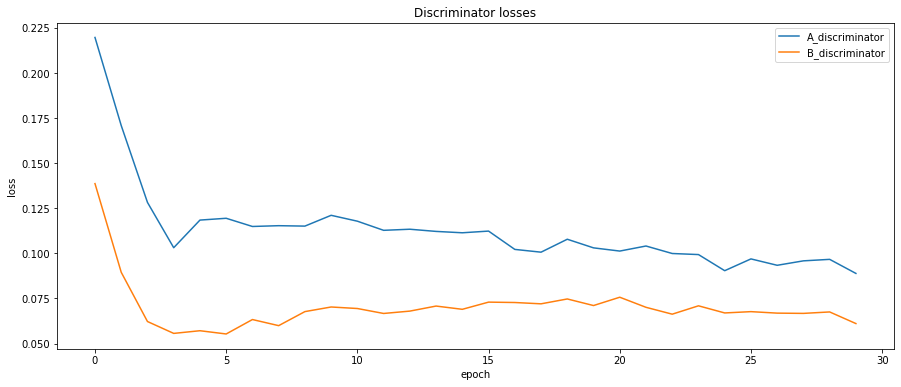

In [14]:
plt.figure(figsize=(15, 6))
plt.plot(losses_photo2portrait['A_discriminator_losses'])
plt.plot(losses_photo2portrait['B_discriminator_losses'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['A_discriminator', 'B_discriminator'])
plt.title('Discriminator losses');

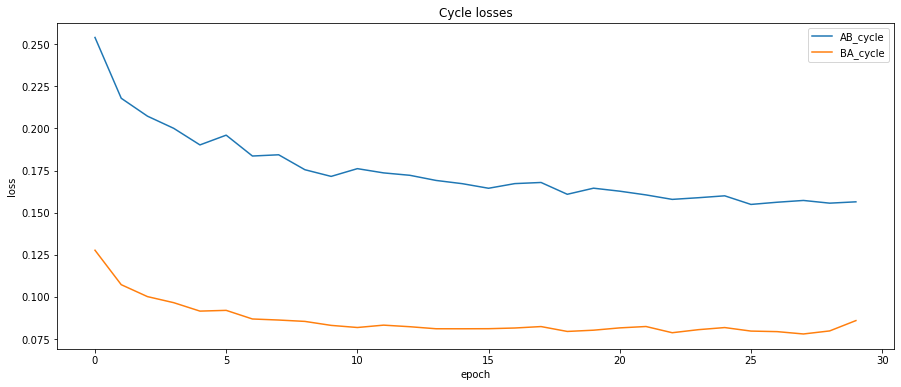

In [15]:
plt.figure(figsize=(15, 6))
plt.plot(losses_photo2portrait['AB_cycle_losses'])
plt.plot(losses_photo2portrait['BA_cycle_losses'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['AB_cycle', 'BA_cycle'])
plt.title('Cycle losses');

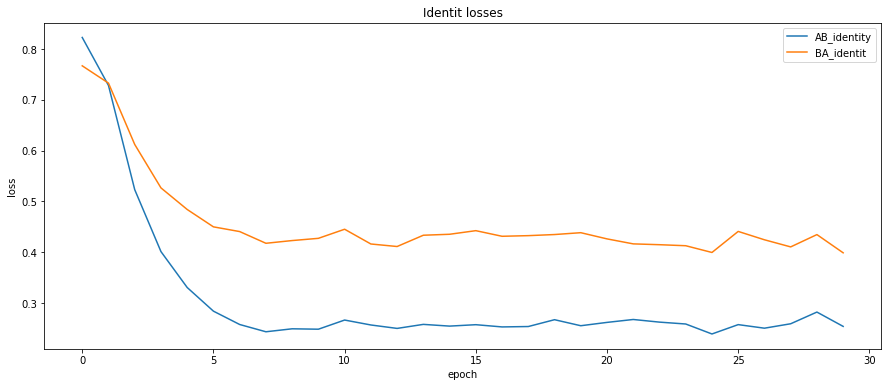

In [16]:
plt.figure(figsize=(15, 6))
plt.plot(losses_photo2portrait['AB_identity_losses'])
plt.plot(losses_photo2portrait['BA_identity_losses'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['AB_identity', 'BA_identit'])
plt.title('Identit losses');

In [17]:
model_AB_photo2portrait = generator().to(device)
model_BA_photo2portrait = generator().to(device)
model_AB_photo2portrait.load_state_dict(torch.load('weights/photo2portrait/AB_generator.pth',
                                        map_location=device))
model_BA_photo2portrait.load_state_dict(torch.load('weights/photo2portrait/BA_generator.pth',
                                        map_location=device))

<All keys matched successfully>

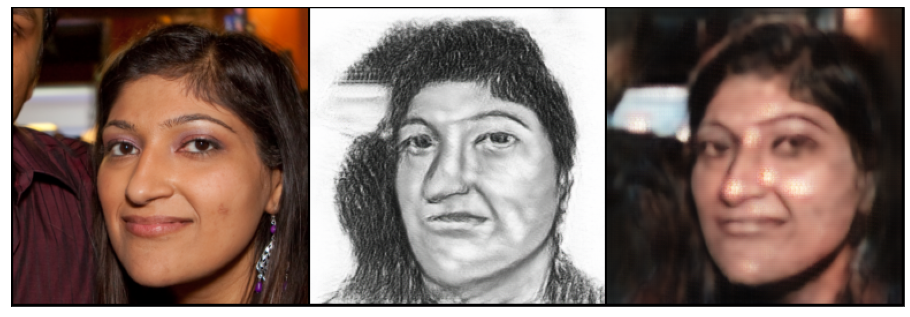

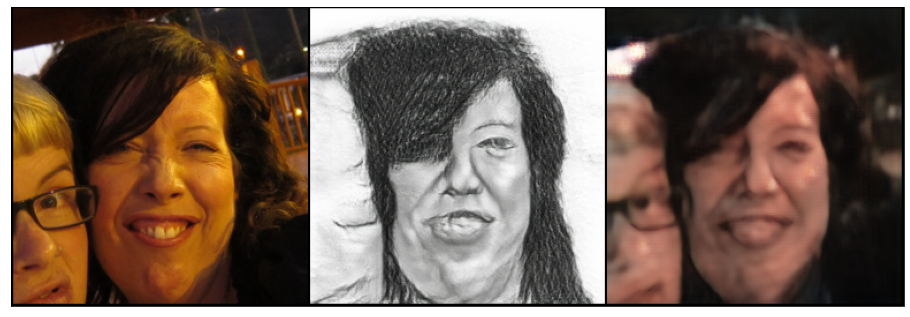

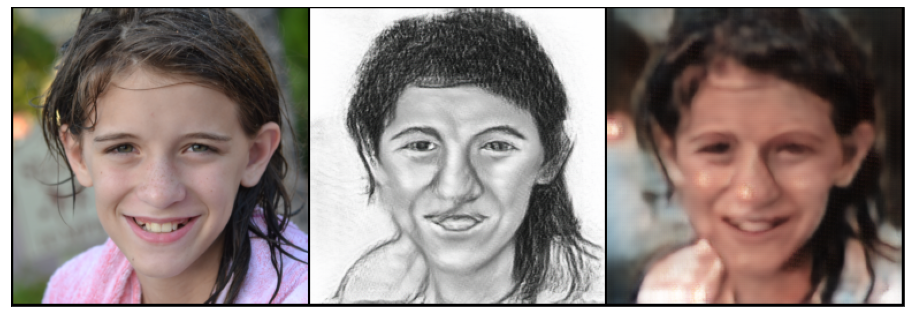

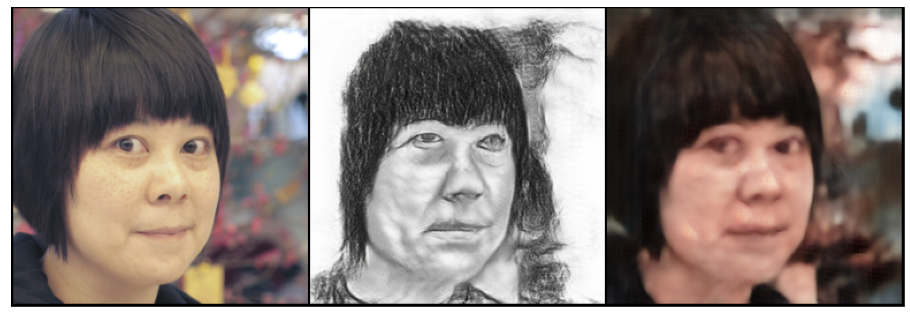

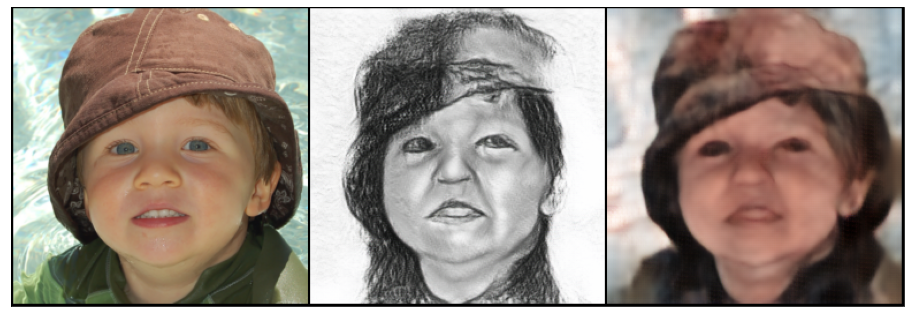

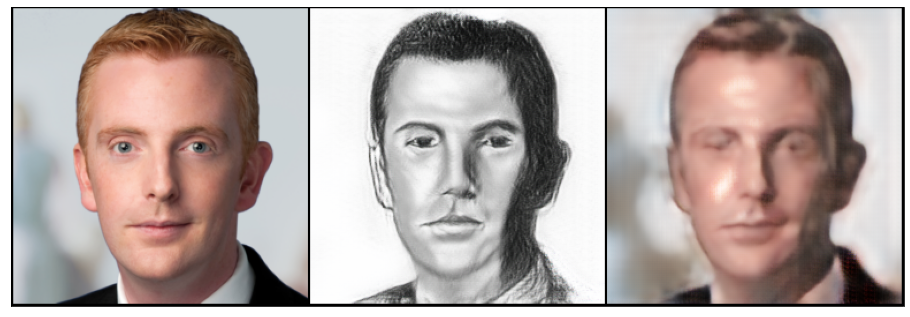

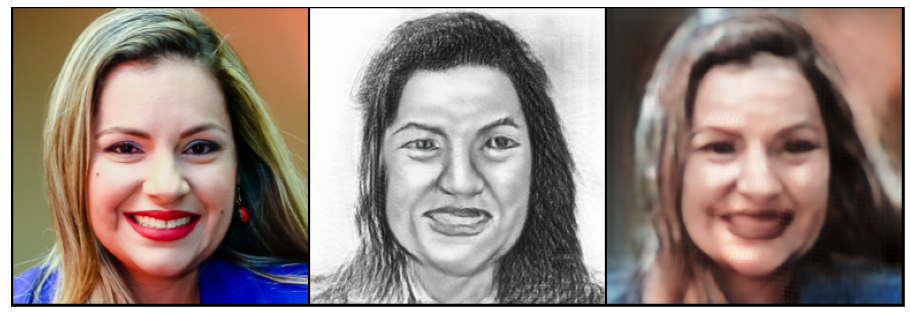

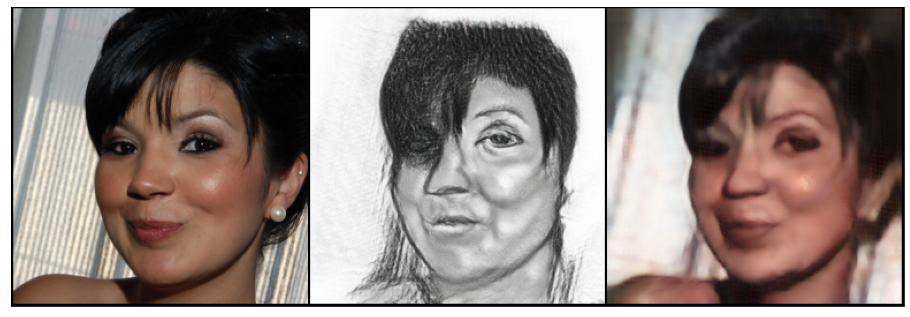

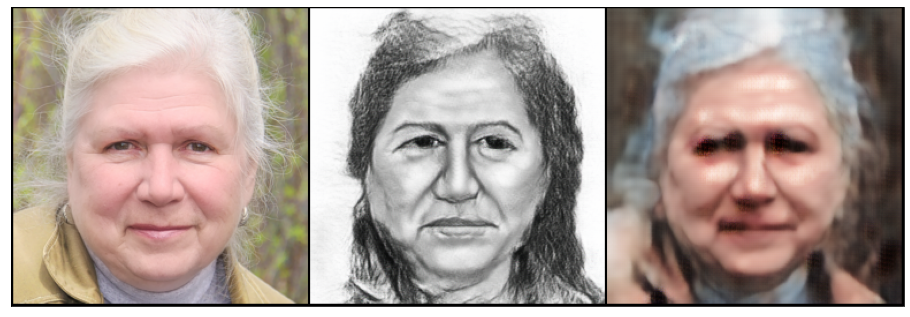

In [18]:
model_AB_photo2portrait.eval()
model_BA_photo2portrait.eval()

show_samples(model_AB_photo2portrait, model_BA_photo2portrait, 'examples/photo2portrait/photos')

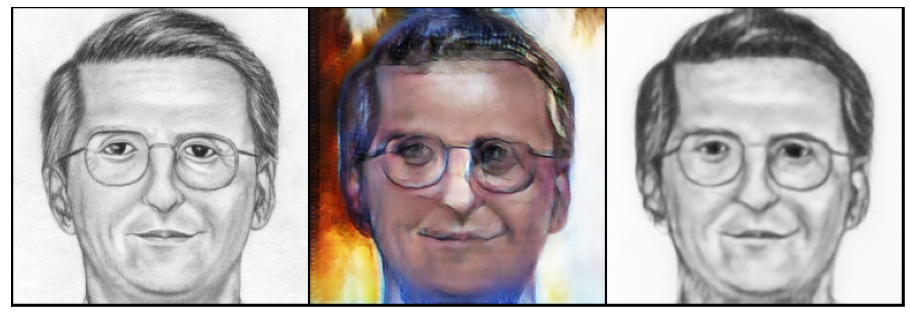

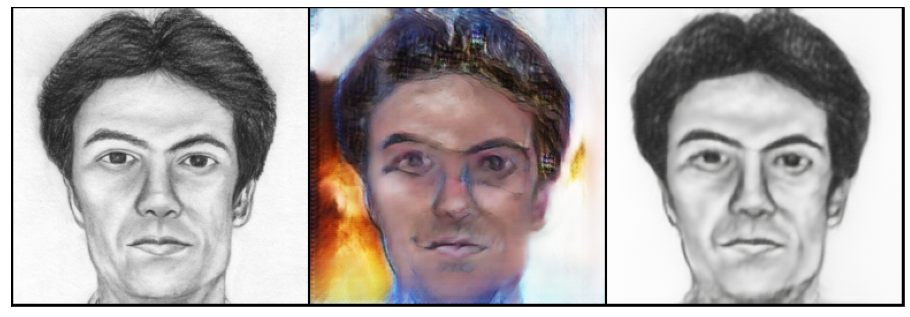

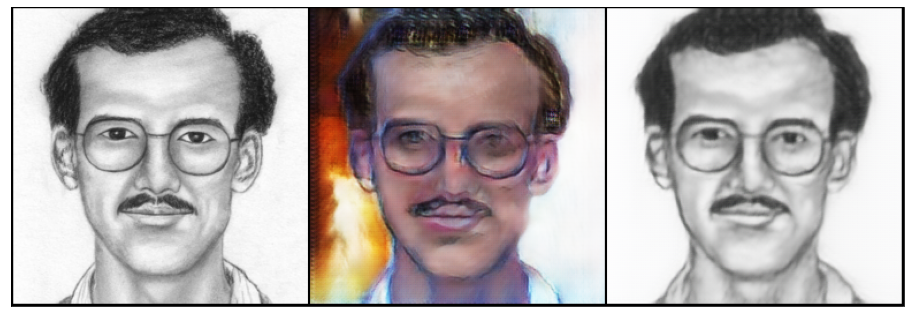

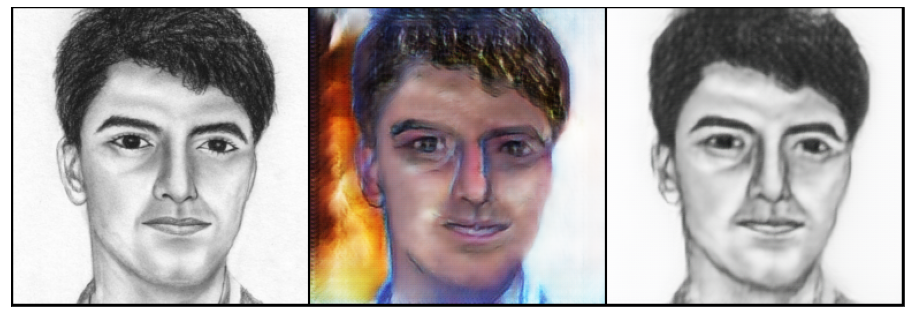

In [19]:
show_samples(model_BA_photo2portrait, model_AB_photo2portrait, 'examples/photo2portrait/potraits',
             resize_size=400, padding=(0, 50, 0, 0))